In [1]:
import cv2
import image_utils as utils
import numpy as np
import matplotlib.pyplot as plt
from pascal_voc_dataset import PascalVOC2012Dataset

In [2]:
dataset = PascalVOC2012Dataset(augmentation_params=None)
N_CLASSES = 5  # Excluding the ignore/void class
CLASS_LABELS = ['background', 'Fucus', 'Zostera Marina', 'Furcellaria Lumbricalis', 'Seperate']
#assert len(CLASS_LABELS) == (N_CLASSES+1)
BATCH_SIZE = 12
IMAGE_SHAPE = (512, 512)  # Includes (12, 12) padding such that the height and width are divisible by 32

In [43]:
img_path = "images/Resized_original_1024/Furcellaria lumbricalis_25.jpg"
label_path = "Segmentations/SegmentationClassPNG/Furcellaria lumbricalis_25.png"

In [44]:
img=utils.imread(img_path)
label=utils.imread(label_path)

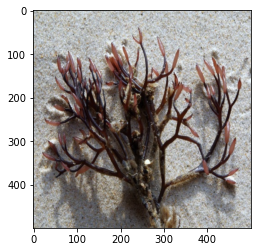

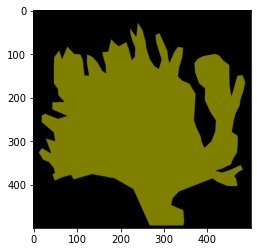

In [45]:
plt.figure()
plt.imshow(img)
plt.show()

plt.figure()
plt.imshow(label)
plt.show()

In [46]:
def dual_plot(im1, im2):
    """Utility function to display 2 images side by side."""
    plt.figure(figsize=(14, 7))
    plt.subplot(121)
    plt.imshow(im1)
    plt.subplot(122)
    plt.imshow(im2)
    plt.show()

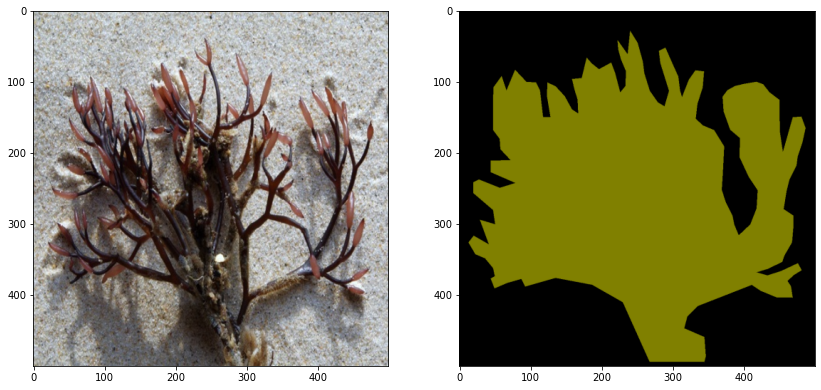

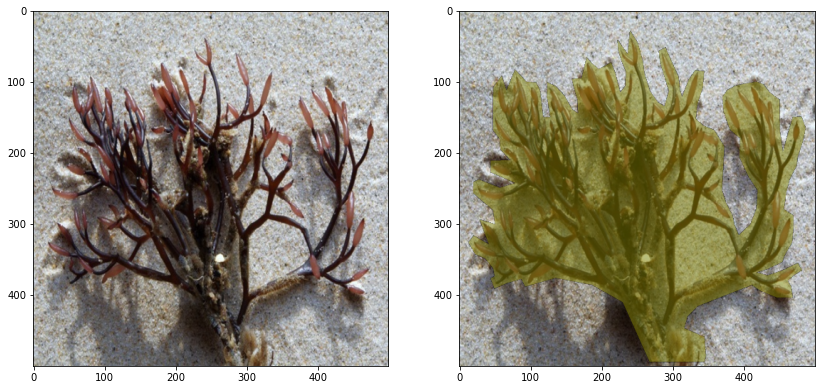

In [47]:
dual_plot(img, label)
dual_plot(img, utils.apply_mask(img, label))

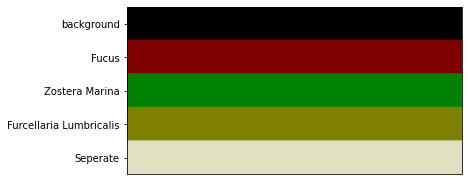

In [48]:
cmap = dataset.cmap
#assert len(cmap) == (N_CLASSES + 1)  # Note that a void/ignore label has been appended to the color map
dataset.color_map_viz(CLASS_LABELS)

## Step by step image transformation

Image transformations are used to augment the data during training to reduce overfitting.
The following transformations have been implemented:
 - Horizontal flip
 - Translation
 - Zoom
 - Rotation
 - Saturation & value
 - Brighness & contrast

### Image padding

The model requires images of width and height that are multiples of 32. The largest side of all PASCAL VOC images is always 500 pixels. Therefore, after performing the various transformations, the images are padded or cropped to shape (512, 512). By default, the below `pad` function appends new rows and columns and fills them with zeros.

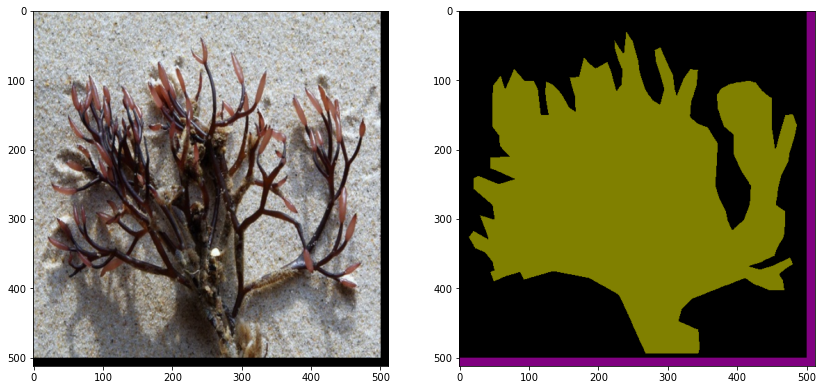

In [49]:
im_padded = utils.pad(img, IMAGE_SHAPE)
label_padded = utils.pad(utils.colors2labels(label, cmap), IMAGE_SHAPE, cval=N_CLASSES)
dual_plot(im_padded, utils.labels2colors(label_padded, cmap))

In [50]:
label = utils.colors2labels(label, cmap)

### Simple transformation with horizontal flipping and jittering

This section implements the data augmentation procedure described in the original paper: "We tried augmenting the training data by randomly mirroring and jittering the images by translating them up to 32 pixels (the coarsest scale of predictions) in each direction."

The jittering (ie. translation) is implemented using a combination of padding and random cropping. I did not use this simple augmentation technique in the final implementation because it delivers no noticeable improvement. It appears not to be sufficient to improve the results, so instead I used a combination of the different transformations listed above including zoom, rotation, and color saturation. This combination is efficient at reducing overfitting and improves the validation metrics.

You may need to run the next cell multiple times to obtain a mirrored image. Notice that from now on, the images are center padded.

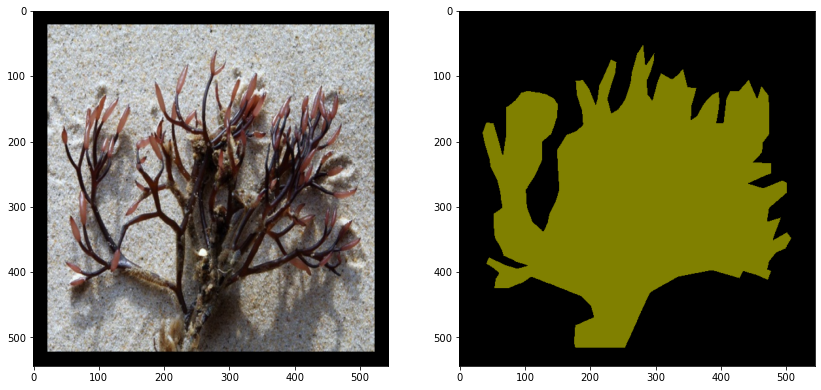

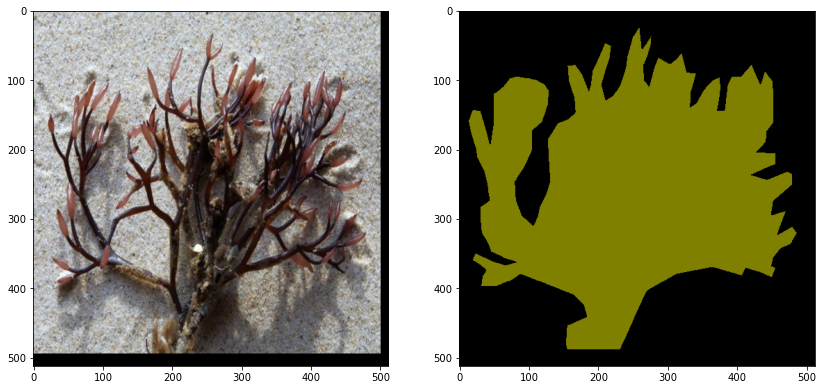

In [51]:
# Randomly flip the image horizontally
x, y = utils.random_flip_axis(img, label, 1)
x = utils.pad(x, np.asarray(IMAGE_SHAPE)+np.asarray((32, 32)), center=True)
y = utils.pad(y, np.asarray(IMAGE_SHAPE)+np.asarray((32, 32)), center=True)
dual_plot(x, utils.labels2colors(y, cmap))

# Randomly crop the image back to the target shape
x, y = utils.random_crop(x, y, (512, 512))
dual_plot(x, utils.labels2colors(y, cmap))

### Gaussian blur

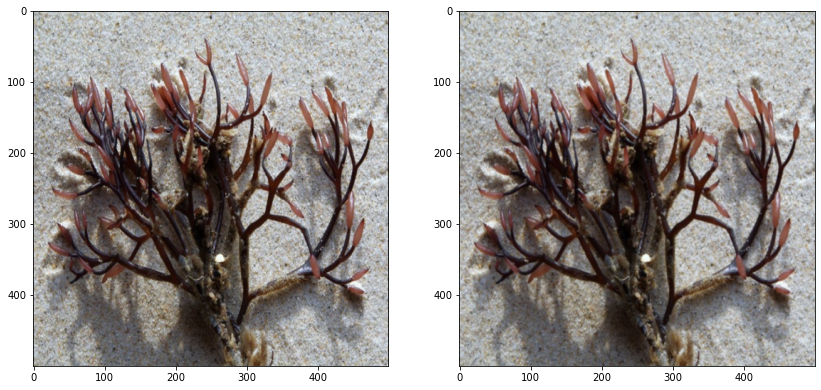

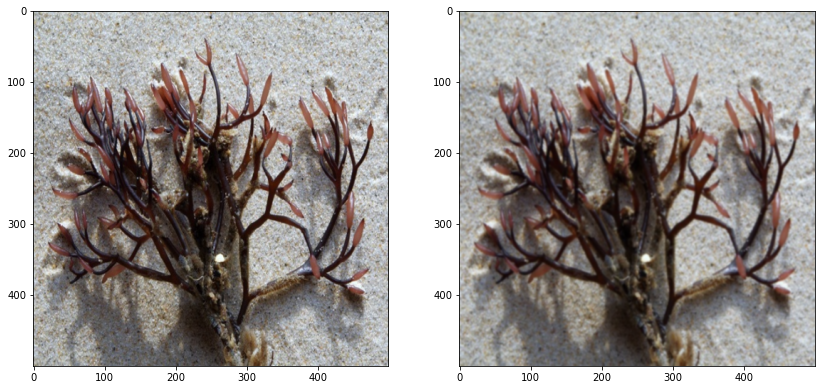

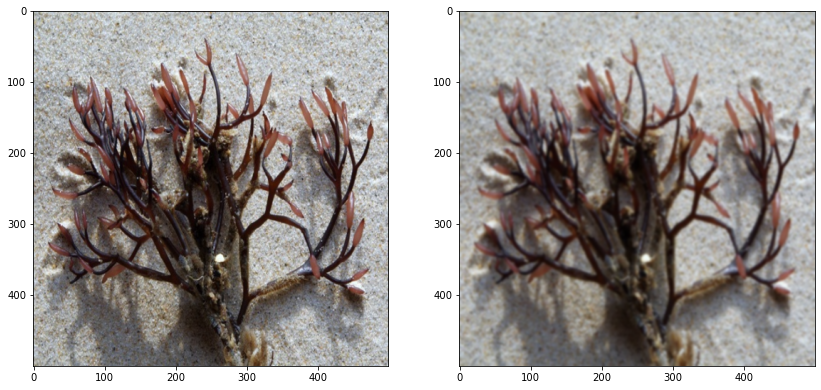

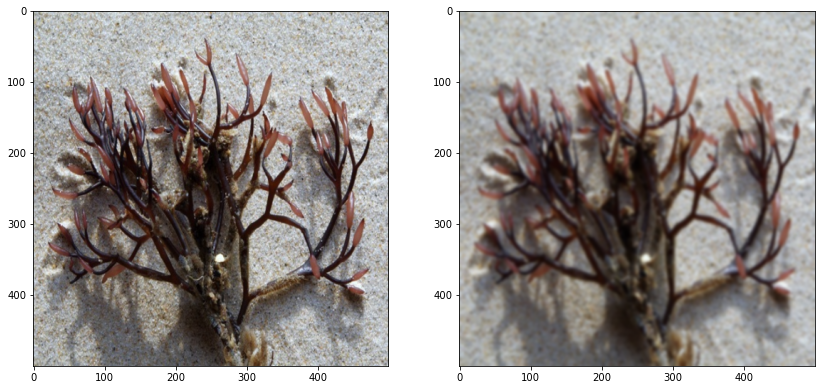

In [52]:
ksize=(11,11)
dual_plot(img, cv2.GaussianBlur(img, ksize, sigmaX=0.5))
dual_plot(img, cv2.GaussianBlur(img, ksize, sigmaX=1))
dual_plot(img, cv2.GaussianBlur(img, ksize, sigmaX=1.5))
dual_plot(img, cv2.GaussianBlur(img, ksize, sigmaX=2))

### Image zoom

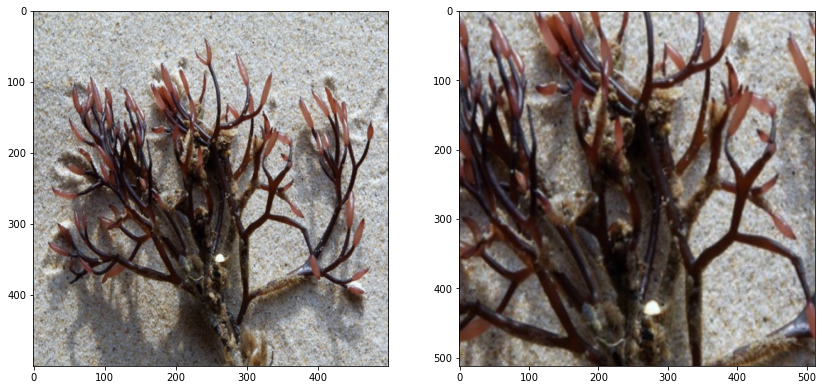

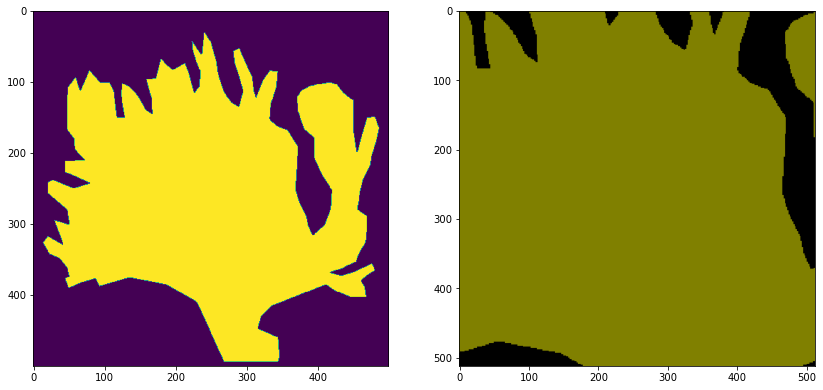

In [53]:
# Apply a random zoom
im_t2, gt_t2 = utils.random_zoom(img, label, zoom_range=(0.5,2))

# Pads (zoom < 1) or crops (zoom > 1) the image to the target shape
im_t2 = utils.pad_or_crop(im_t2, IMAGE_SHAPE)
gt_t2 = utils.pad_or_crop(gt_t2, IMAGE_SHAPE, cval=N_CLASSES)

# Plots results
dual_plot(img, im_t2)
dual_plot(label, utils.labels2colors(gt_t2, cmap))

### Image brightness and contrast

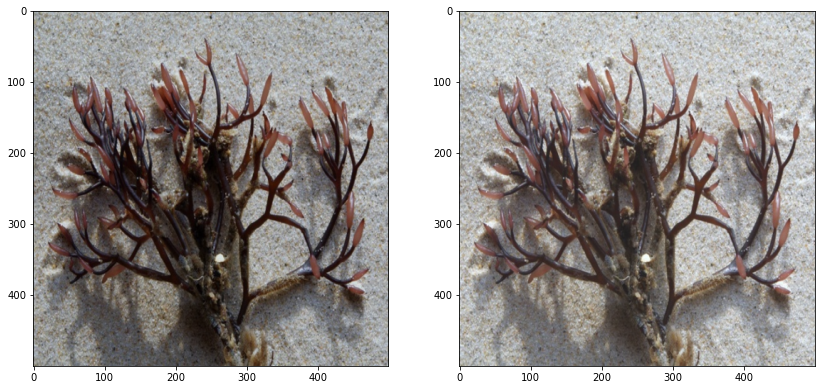

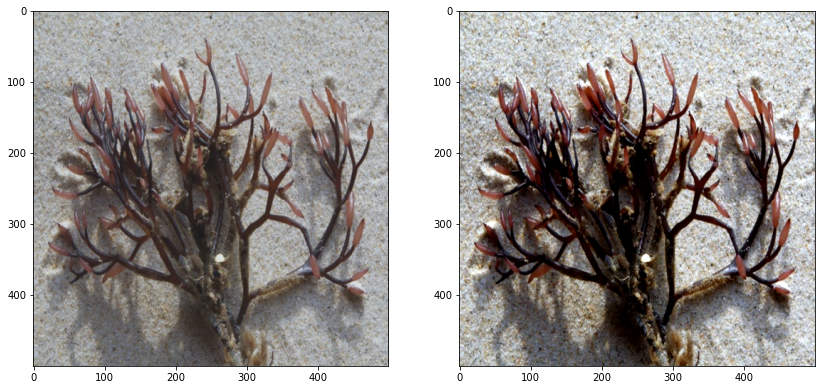

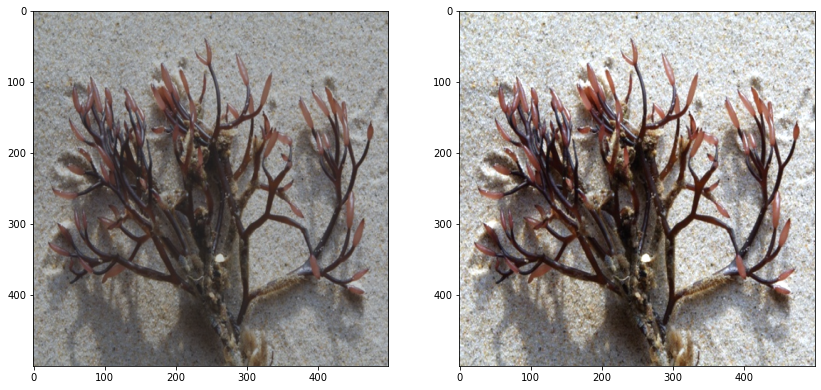

In [54]:
# Adjust brightness only
dual_plot(utils.adjust_brightness_and_contrast(img, -30, 0), utils.adjust_brightness_and_contrast(img, 30, 0))

# Adjust contrasts only
dual_plot(utils.adjust_brightness_and_contrast(img, 0, -15), utils.adjust_brightness_and_contrast(img, 0, 15))

# Adjust both brightness and contrasts
dual_plot(utils.adjust_brightness_and_contrast(img, -30, -15), utils.adjust_brightness_and_contrast(img, 30, 15))

### Image saturation and value

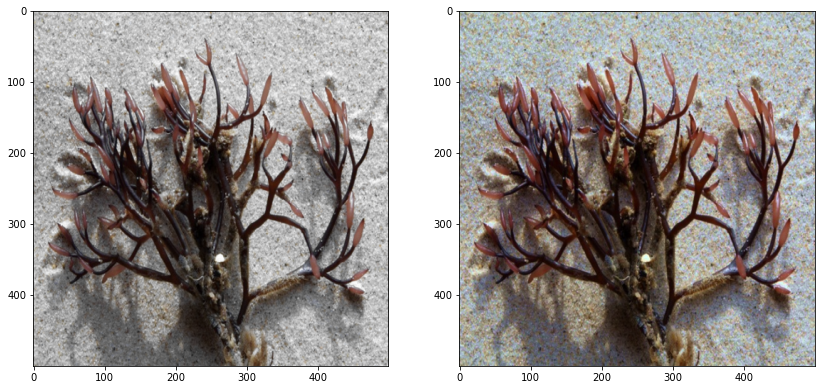

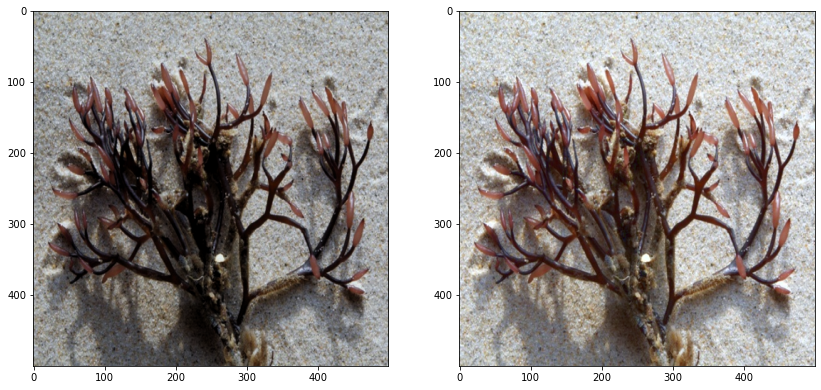

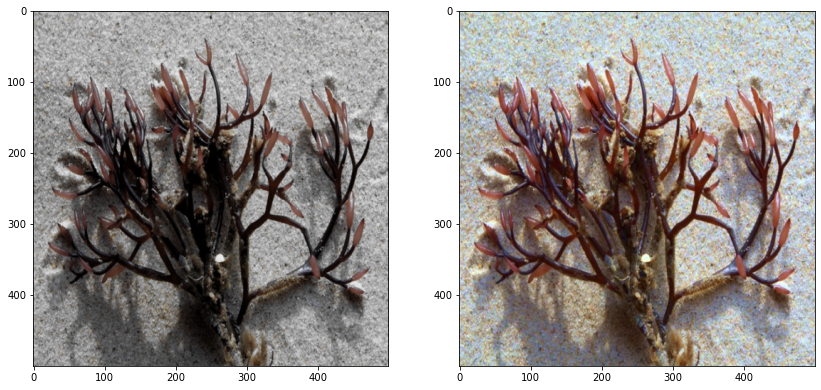

In [55]:
# Adjust saturation only
dual_plot(utils.adjust_saturation_and_value(img, -20, 0), utils.adjust_saturation_and_value(img, 20, 0))

# Adjust value only
dual_plot(utils.adjust_saturation_and_value(img, 0, -20), utils.adjust_saturation_and_value(img, 0, 20))

# Adjust saturation and value 
dual_plot(utils.adjust_saturation_and_value(img, -20, -20), utils.adjust_saturation_and_value(img, 20, 20))

### Putting all transformations together

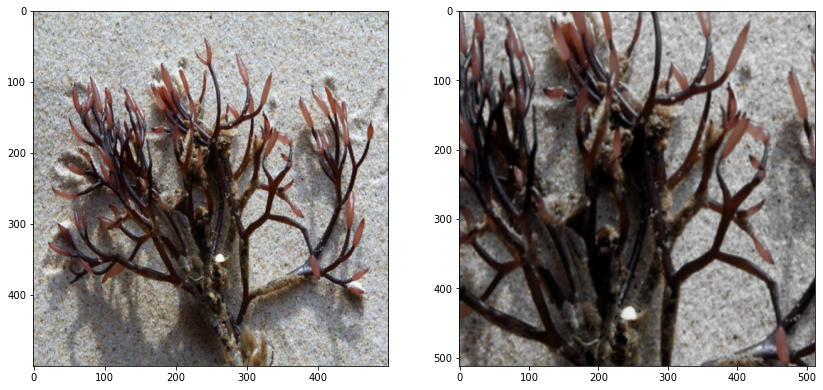

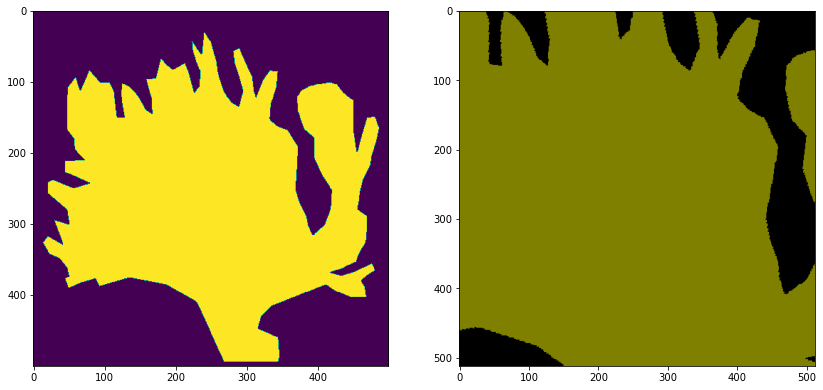

In [59]:
im_t4, gt_t4 = utils.random_transform(img, label, IMAGE_SHAPE, saturation_range=(-20, 20), value_range=(-20, 20), flip_lr=True, 
                                      rotation_range=(-10, 10), shift_range=(32, 32), zoom_range=(0.5, 2), 
                                      ignore_label=N_CLASSES)
dual_plot(img, im_t4)
dual_plot(label, utils.labels2colors(gt_t4, cmap))

### AUGMENTATIONS ADDED

## SEPERATE WORK

In [19]:
path="train.txt"
with open(path) as file:
    filenames = [s.rstrip('\n') for s in file.readlines()]

In [20]:
filenames

['Furcellaria lumbricalis_25',
 'Furcellaria lumbricalis_24',
 'Fucus_7',
 'Fucus_13',
 'Fucus_12',
 'Furcellaria lumbricalis_8',
 'Fucus_37',
 'Zostera Marina_3',
 'Furcellaria lumbricalis_1',
 'Zostera Marina_20',
 'Fucus_6',
 'Fucus_25',
 'Fucus_9',
 'Fucus_19',
 'Fucus_17',
 'Zostera Marina_12',
 'Fucus_23',
 'Fucus_35',
 'Furcellaria lumbricalis_15',
 'Fucus_32',
 'Zostera Marina_26',
 'Zostera Marina_17',
 'Furcellaria lumbricalis_17',
 'Furcellaria lumbricalis_6',
 'Fucus_15',
 'Furcellaria lumbricalis_35',
 'Fucus_34',
 'Zostera Marina_9',
 'Furcellaria lumbricalis_26',
 'Fucus_21',
 'Furcellaria lumbricalis_11',
 'Furcellaria lumbricalis_27',
 'Furcellaria lumbricalis_3',
 'Furcellaria lumbricalis_22',
 'Furcellaria lumbricalis_2',
 'Furcellaria lumbricalis_13',
 'Zostera Marina_29',
 'Zostera Marina_1',
 'Furcellaria lumbricalis_5',
 'Fucus_39',
 'Fucus_27',
 'Zostera Marina_10',
 'Fucus_38',
 'Zostera Marina_15',
 'Fucus_30',
 'Fucus_33',
 'Zostera Marina_27',
 'Fucus_24',
 

In [65]:
Aug_list = []
for file in filenames:
    
    path_img = "images/Resized_original_1024/"
    label_path = "Segmentations/SegmentationClassPNG/"
    
    img_path = path_img + file + ".jpg"
    label_path = label_path + file + ".png"
    
    
    img=utils.imread(img_path)
    label=utils.imread(label_path)
    label = utils.colors2labels(label, cmap)
    
    for i in range(15):
        
        try:
            im_t4, gt_t4 = utils.random_transform(img, label, IMAGE_SHAPE, saturation_range=(-20, 20), value_range=(-20, 20), flip_lr=True,rotation_range=(-10, 10), shift_range=(32, 32), zoom_range=(0.5, 2), 
                                      ignore_label=N_CLASSES)
            
            l=utils.labels2colors(gt_t4, cmap)
            
            utils.imwrite("Augmentations/images/"+file+"_" + str(i) + "_" + ".jpg",im_t4)
            
            utils.imwrite("Augmentations/Augment/"+file+"_" + str(i) + "_" + ".png",l)
            
            Aug_list.append(file+"_" + str(i) + "_")
        except:
            print(i)
    

4
6
8
12
2
3
5
8
9
12
13
0
2
7
8
9
10
13
14
0
3
5
7
8
10
11
14
0
2
4
8
11
13
3
4
5
8
9
10
11
13
14
1
3
6
8
10
12
13
14
0
2
4
6
8
11
13
14
2
3
5
6
13
1
2
4
5
7
8
9
13
14
8
9
10
13
14
0
7
8
13
14
0
3
6
13
14
0
3
5
8
9
11
12
1
4
8
10
0
1
2
3
4
5
11
13
14
0
1
2
3
11
12
1
8
9
10
14
2
3
4
5
6
7
9
12
14
1
4
11
13
1
2
3
4
5
12
13
14
0
2
4
5
7
8
9
12
4
5
6
8
11
14
1
2
4
6
9
11
13
0
5
6
7
8
12
13
14
0
1
2
3
4
6
9
14
0
1
6
8
9
1
3
5
10
13
14
6
7
9
12
2
5
7
8
11
12
14
1
5
6
13
14
1
3
8
9
11
12
0
1
11
2
6
7
11
13
14
3
6
9
13
0
4
5
6
8
11
12
14
0
2
9
12
13
0
3
4
8
9
13
14
2
3
4
5
9
10
13
14
1
6
8
12
13
2
4
6
7
10
11
12
14
4
6
7
8
10
11
12
1
5
6
7
8
11
12
13
14
0
1
2
3
5
6
9
10
13
14
0
5
8
9
10
2
3
4
6
8
10
11
12
13
14
1
4
6
9
12
14
0
2
4
5
7
8
9
10
13
14
2
5
6
7
8
11
12
14
3
4
5
7
9
11
13
2
4
5
6
8
9
13
14
2
7
9
10
12
13
0
2
7
9
10
11
0
1
2
4
5
7
11
13
14
0
1
2
5
6
7
8
13
14
2
3
6
10
0
2
4
6
9
10
14
11
13
14
0
8
9
12
1
4
9
11
12
13
14


In [ ]:
path="trainval.txt"
with open(path) as file:
    filenames = [s.rstrip('\n') for s in file.readlines()]

In [ ]:
img_path = "VOCdevkit/VOC2012/JPEGImages/"
segmentation_path = "VOCdevkit/VOC2012/SegmentationClass/"

In [ ]:
for im in filenames:
    img = cv2.imread(img_path + im + ".jpg")
    cv2.imwrite("images/"+im + ".jpg",img)

In [ ]:
for im in filenames:
    img = cv2.imread(segmentation_path + im + ".png")
    cv2.imwrite("Segmentations/"+im + ".png",img)

## This Part is also seperate

In [ ]:
path="train.txt"
with open(path) as file:
    filenames = [s.rstrip('\n') for s in file.readlines()]

In [ ]:
Aug_list = []

for file in filenames:
    img=utils.imread("Images/" + file + ".jpg")
    label=utils.imread("Segmentations/" + file + ".png")
    
    h, w, _ = img.shape
    
    label = utils.colors2labels(label, cmap)
    
    for i in range(1):
        
        im_t4, gt_t4 = utils.random_transform(img, label, (h, w), saturation_range=(-20, 20), value_range=(-20, 20), flip_lr=True, 
                                      rotation_range=(-10, 10), shift_range=(32, 32), zoom_range=(0.5, 2), 
                                      ignore_label=N_CLASSES)
        
        #im_t4 = cv2.cvtColor(im_t4, cv2.COLOR_RGB2BGR)
        #im_t4 = cv2.resize(img,(w,h) , interpolation = cv2.INTER_AREA)
        #cv2.imwrite("Augmented_images/"+file + "_aug_" + str(i) +"_" + ".jpg",im_t4)
        
        
        utils.imwrite("Augmented_images/"+file + "_aug_" + str(i) +"_" + ".jpg",im_t4)
        
        utils.imwrite("Augmented_Segmentations/"+file + "_aug_" + str(i) +"_"+ ".png",utils.labels2colors(gt_t4, cmap))
        
        Aug_list.append(file + "_aug_" + str(i) +"_")
    

In [ ]:
for file in filenames:
    img=utils.imread("Images/" + file + ".jpg")
    label=utils.imread("Segmentations/" + file + ".png")
    
    print(img.shape)
    print(label.shape)

In [66]:
with open('Augmentation.txt', 'w') as f:
    for line in Aug_list:
        f.write(line)
        f.write('\n')

In [ ]:
to_set(0,"apple")

In [ ]:
fruits={"apple":4}

[x for x in fruits.keys()]

In [ ]:
my_game = game.create()

In [ ]:
def g():
    print("adil")

In [ ]:
a=g()

In [ ]:
a